# Podwójne wahadło

# Cele projektu
1. Znalezienie sposobu na numeryczne rozwiązanie układu nieliniowych równań różniczkowych drugiego stopnia
2. Stworzenie symulacji przedstawiającej ruch podwójnego wahadła
3. <b>Wyliczenie stosunku małej zmiany warunków początkowych (kątów jakie nici tworzą z pionem lub szybkości kątowych) do różnicy stanów podwójnego wahadła po pewnym czasie t<b>
4. <b>Zobrazowanie (np. poprzez animację) wpływu jaki na ruch podwójnego wahadła wywiera zmiana mas punktów materialnych lub długości nici<b>


## Poprawiony kod algorytmu RK4

In [ ]:
using Plots, DataFrames


## funkcja pochodna


function G(Z::Vector, t::Union{Int64, Float64}, g::Union{Int64, Float64}, m1::Union{Int64, Float64},
        m2::Union{Int64, Float64}, l1::Union{Int64, Float64}, l2::Union{Int64, Float64})

    a1dt, a2dt = Z[1], Z[2]
    a1, a2 = Z[3], Z[4]

    m11, m12 = (m1+m2)*l1, m2*l2*cos(a1-a2)
    m21, m22 = l1*cos(a1-a2), l2

    M = [m11 m12 ; m21 m22]

    f1 = -m2*l2*a2dt*a2dt*sin(a1-a2) - (m1+m2)*g*sin(a1)
    f2 = l1*a1dt*a1dt*sin(a1-a2) - g*sin(a2)

    F = [f1 ; f2]

    acc = inv(M)*F

    return [acc[1], acc[2], a1dt, a2dt]
end


## krok


function Step(t::Union{Int64, Float64}, Z::Vector, h::Union{Int64, Float64},
            g::Union{Int64, Float64}, m1::Union{Int64, Float64}, m2::Union{Int64, Float64}, l1::Union{Int64, Float64}, l2::Union{Int64, Float64})

    k1 = h*G(Z, t, g, m1, m2, l1, l2)
    k2 = h*G(Z + k1/2, t + h/2, g, m1, m2, l1, l2)
    k3 = h*G(Z + k2/2, t + h/2, g, m1, m2, l1, l2)
    k4 = h*G(Z+ k3, t + h, g, m1, m2, l1, l2)

    return Z + (k1+2*k2+2*k3+k4)/6
end


## rozwiązujemy równania ruchu dla konkretnego wahadła         


function pendulum(t, koniec,bh, m1, m2, l1, l2, g, Z0)
    
    WYNIKI = Matrix{Float64}(undef, Int64(ceil((koniec-t)/h))+1, 5)
    WYNIKI[1,1] = t
    WYNIKI[1,2] = Z0[1]
    WYNIKI[1,3] = Z0[2]
    WYNIKI[1,4] = Z0[3]
    WYNIKI[1,5] = Z0[4]

    for d in 2:Int64(ceil((koniec-t)/h))+1
        WYNIKI[d,1] = t+(d-1)*h
        result = Step(WYNIKI[d-1,1], [WYNIKI[d-1,2], WYNIKI[d-1,3], WYNIKI[d-1,4], WYNIKI[d-1,5]], h, g, m1, m2, l1, l2)
        WYNIKI[d,2] = result[1]
        WYNIKI[d,3] = result[2]
        WYNIKI[d,4] = result[3]
        WYNIKI[d,5] = result[4]
    end

    WYNIKI[:,4] = WYNIKI[:,4] .% (2*π)
    WYNIKI[:,5] = WYNIKI[:,5] .% (2*π)

    return WYNIKI
end

## wykres energii całkowitej


function energy_plot(t::Vector, alfa::Vector, beta::Vector, alfadt::Vector,
        betadt::Vector, m1::Union{Float64, Int64} ,m2::Union{Float64, Int64},
        l1::Union{Float64, Int64} , l2::Union{Float64, Int64}, g::Union{Float64, Int64})

    ek1(alfa, beta, alfadt, betadt, m1 ,m2 ,l1 , l2, g) = m1/2*l1*l1*alfadt*alfadt


    ek2(alfa, beta, alfadt, betadt, m1 ,m2 ,l1 , l2, g) = (m2/2*(alfadt*alfadt*l1*l1 + betadt*betadt*l2*l2+
                                                            2*alfadt*betadt*l1*l2*cos(alfa-beta)))
    
    ep1(alfa, beta, alfadt, betadt, m1 ,m2 ,l1 , l2, g) = -m1*g*l1*cos(alfa)

    ep2(alfa, beta, alfadt, betadt, m1 ,m2 ,l1 , l2, g) = -m2*g*(l1*cos(alfa) + l2*cos(beta))

    display(plot(t, ek1.(alfa, beta, alfadt, betadt, m1, m2, l1, l2, g)
                    +ek2.(alfa, beta, alfadt, betadt, m1, m2, l1, l2, g)
                    +ep1.(alfa, beta, alfadt, betadt, m1, m2, l1, l2, g)
                    +ep2.(alfa, beta, alfadt, betadt, m1, m2, l1, l2, g), label=""))
    
end


## Wielkość kroku h, a zmiany energii

In [ ]:
wyniki1 = pendulum(0, 100, 0.01, 3, 1, 2, 1, 1, [π/2+1, π/2+1, π/2+1, π/2+1])
wyniki2 = pendulum(0, 100, 0.1, 3, 1, 2, 1, 1, [π/2+1, π/2+1, π/2+1, π/2+1])

dane1 = DataFrame(t = wyniki1[:,1],
                    alfa = wyniki1[:,4],
                    beta = wyniki1[:,5],
                    alfadt = wyniki1[:,2],
                    betadt = wyniki1[:,3])

dane2 = DataFrame(t = wyniki2[:,1],
                    alfa = wyniki2[:,4],
                    beta = wyniki2[:,5],
                    alfadt = wyniki2[:,2],
                    betadt = wyniki2[:,3]);

In [ ]:
energy_plot(dane2.t, dane2.alfa, dane2.beta, dane2.alfadt, dane2.betadt, 3, 1, 2, 1, 1)

Dla h = 0.1 po 1000 iteracjach strata energii wyniosła około 0,003 J, co daje nam średnią stratę energii wynoszącą 300 nJ na iterację.

In [ ]:
energy_plot(dane1.t, dane1.alfa, dane1.beta, dane1.alfadt, dane1.betadt, 3, 1, 2, 1, 1)

Dla h = 0.01 po 10000 iteracjach strata energii jest mniejsza niż 1e-7 J.
#### Wyniki:
Potwierdziło się przypuszczenie, że zmniejszenie rozmiaru kroku korzystnie wpływa na dokładność obliczeń (mniejsze różnice energii). Jednakże, nawet dla kroku h = 0.1 błędy numeryczne wydają się mieć marginalne znaczenie. Z tego powodu im więcej obliczeń wykonywaliśmy, tym większy był krok którego używaliśmy.

## Energia całkowita układu a chaotyczność

In [ ]:
wyniki3 = pendulum(0, 1000, 0.01, 3, 1, 2, 1, 1, [0, 0, 0, π/18])
dane3 = DataFrame(t = wyniki3[:,1],
                    alfa = wyniki3[:,4],
                    beta = wyniki3[:,5],
                    alfadt = wyniki3[:,2],
                    betadt = wyniki3[:,3])

wyniki4 = pendulum(0, 1000, 0.01, 3, 1, 2, 1, 1, [0, 0, 0, π/18] + [1e-5, 1e-5, 1e-5, 1e-5]);

In [ ]:
energy_plot(dane3.t, dane3.alfa, dane3.beta, dane3.alfadt, dane3.betadt, 3, 1, 2, 1, 1)

In [ ]:
wyniki5 = pendulum(0, 1000, 0.01, 3, 1, 2, 1, 1, [0, 0, π-π/18, 0])
dane5 = DataFrame(t = wyniki5[:,1],
                    alfa = wyniki5[:,4],
                    beta = wyniki5[:,5],
                    alfadt = wyniki5[:,2],
                    betadt = wyniki5[:,3])

wyniki6 = pendulum(0, 1000, 0.01, 3, 1, 2, 1, 1, [0, 0, π, 0] + [1e-5, 1e-5, 1e-5, 1e-5]);

In [ ]:
energy_plot(dane5.t, dane5.alfa, dane5.beta, dane5.alfadt, dane5.betadt, 3, 1, 2, 1, 1)

In [39]:
(wyniki4[end,2:5] - wyniki3[end,2:5])/1e-5

4-element Vector{Float64}:
 -0.2787533273641146
 -5.631466363714698
 -0.18705727479056963
 -4.364074385115879

In [40]:
(wyniki6[end,2:5] - wyniki5[end,2:5])/1e-5

4-element Vector{Float64}:
 -147179.95759125813
  -97868.61466847305
 -197981.0535542785
 -183709.15577576525

Na podstawie powyższych wyników wysnuwamy przypuszczenie, że im większa energia całkowita układu, tym jest on wrażliwszy na małe zmiany warunków początkowych

## Energia całkowita a trajektoria wahadła

In [ ]:
m1=3
m2=1
l1=2
l2=1

lista1 = []
lista2 = []
lista3 = []
lista4 = []

for j in 1:length(dane5.alfa)
    append!(lista1, l1*sin(dane3.alfa[j]) + l2*sin(dane3.beta[j]))
    append!(lista2, -l1*cos(dane3.alfa[j]) - l2*cos(dane3.beta[j]))
    append!(lista3, l1*sin(dane5.alfa[j]) + l2*sin(dane5.beta[j]))
    append!(lista4, -l1*cos(dane5.alfa[j]) - l2*cos(dane5.beta[j]))
end

In [ ]:
plot(lista1, lista2,
        xlim = (-l1-l2-1,l1+l2+1),
        ylim = (-l1-l2-1,l1+l2+1),
        grid = :off,
        ratio = :equal,
        linewidth = 0.125,
        label = "",
        background_color = :grey25,
        legend = :none,
        title = "")

In [ ]:
plot(lista3, lista4,
        xlim = (-l1-l2-1,l1+l2+1),
        ylim = (-l1-l2-1,l1+l2+1),
        grid = :off,
        ratio = :equal,
        linewidth = 0.125,
        label = "",
        background_color = :grey25,
        legend = :none,
        title = "")

## Iloczyn kartezjański dwóch wektorów

In [ ]:
function cartesianProduct(x::Vector, y::Vector)
    M = Matrix{Union{Vector, Int64, Float64}}(undef, length(x), length(y))
    for i in eachindex(x), j in eachindex(y)
        M[i,j] = [x[i],y[j]]
    end
    return M
end

In [ ]:
x = Vector(LinRange(-π, π, 50))
E = cartesianProduct(x,x)

for i in eachindex(E)
    E[i] = [0, 0, E[i][1], E[i][2]]
end

M = copy(E);

In [ ]:
ek1(alfa, beta, alfadt, betadt, m1 ,m2 ,l1 ,l2, g) = m1/2*l1*l1*alfadt*alfadt


ek2(alfa, beta, alfadt, betadt, m1 ,m2 ,l1 , l2, g) = (m2/2*(alfadt*alfadt*l1*l1 + betadt*betadt*l2*l2+
                                                        2*alfadt*betadt*l1*l2*cos(alfa-beta)))
    
ep1(alfa, beta, alfadt, betadt, m1 ,m2 ,l1 , l2, g) = -m1*g*l1*cos(alfa)

ep2(alfa, beta, alfadt, betadt, m1 ,m2 ,l1 , l2, g) = -m2*g*(l1*cos(alfa) + l2*cos(beta))

energy(alfa, beta, alfadt, betadt, m1 ,m2 ,l1 , l2, g) = (ek1(alfa, beta, alfadt, betadt, m1 ,m2 ,l1 , l2, g)+
                                                        ek2(alfa, beta, alfadt, betadt, m1 ,m2 ,l1 , l2, g)+
                                                        ep1(alfa, beta, alfadt, betadt, m1 ,m2 ,l1 , l2, g)+
                                                        ep2(alfa, beta, alfadt, betadt, m1 ,m2 ,l1 , l2, g))

In [ ]:
for i in eachindex(E)
    E[i] = energy(E[i]..., m1, m2, l1, l2, g)
end

In [ ]:
heatmap(x, x, E,
    ratio = :equal,
    aspect_ratio=1,
    colorrange=cgrad(:thermal)
    )

In [ ]:
Mₑ = M + Matrix(rand([rand([-1e-5, 1e-5],4)],length(x),length(x)))

Mₙ = pendulum.(0, 1000, 0.1, m1, m2, l1, l2, g, M)
Mₑₙ = pendulum.(0, 1000, 0.1, m1, m2, l1, l2, g, Mₑ)

W = copy(M)

for i in eachindex(W)
    W[i] = maximum(abs.((Mₙ[i][end,2:5]-Mₑₙ[i][end,2:5])/1e-5))
end

In [ ]:
heatmap(x, x, log10.(W),
    ratio = :equal,
    aspect_ratio=1,
    colorrange=cgrad(:thermal)
    )

In [ ]:
a = @animate for t in 1:length(dane10.alfa)
    plot([0,l1*sin(dane10.alfa[t]), l1*sin(dane10.alfa[t]) + l2*sin(dane10.beta[t])], 
        [0,-l1*cos(dane10.alfa[t]), -l1*cos(dane10.alfa[t]) - l2*cos(dane10.beta[t])], 
        xlim = (-5,5),
        ylim = (-5,5),
        grid = :off,
        ratio = :equal,
        linewidth = 3,
        label = "",
        background_color = :grey25,
        legend = :none,
        title = ""
    )
    scatter!(lista1[max(1,t-15):t],lista2[max(1,t-15):t],
        markercolor = :orange1
    )
    scatter!([0],
        [0],
        markersize = 3,
        markercolor = :white
        )
    scatter!([l1*sin(dane10.alfa[t])], 
        [-l1*cos(dane10.alfa[t])],  
        markersize = 10,
        markercolor = :white
    )
    scatter!([l1*sin(dane10.alfa[t]) + l2*sin(dane10.beta[t])], 
        [-l1*cos(dane10.alfa[t]) - l2*cos(dane10.beta[t])],  
        markersize = 10,
        markercolor = :white
    )

end
gif(a, "wahadlo3.gif", fps = 30)

## Wpływ zmiany wartości długości nici i masy punktów materialnych na zmianę trajektorii wahadła
#### Zmiana długości nici

In [ ]:
lista1a = []
lista1b = []
lista2a = []
lista2b = []
lista3a = []
lista3b = []
lista4a = []
lista4b = []

wyniki1 = pendulum(0, 100, 0.05, 1, 1, 1, 1, 9.81, [0, 0, π/2, π/2])
wyniki2 = pendulum(0, 100, 0.05, 1, 1, 2, 2, 9.81, [0, 0, π/2, π/2])
wyniki3 = pendulum(0, 100, 0.05, 1, 1, 3, 3, 9.81, [0, 0, π/2, π/2])
wyniki4 = pendulum(0, 100, 0.05, 1, 1, 4, 4, 9.81, [0, 0, π/2, π/2])

dat1 = DataFrame(t = wyniki1[:,1],
                    alfa = wyniki1[:,4],
                    beta = wyniki1[:,5],
                    alfadt = wyniki1[:,2],
                    betadt = wyniki1[:,3])

dat2 = DataFrame(t = wyniki2[:,1],
                    alfa = wyniki2[:,4],
                    beta = wyniki2[:,5],
                    alfadt = wyniki2[:,2],
                    betadt = wyniki2[:,3])

dat3 = DataFrame(t = wyniki3[:,1],
                    alfa = wyniki3[:,4],
                    beta = wyniki3[:,5],
                    alfadt = wyniki3[:,2],
                    betadt = wyniki3[:,3])

dat4 = DataFrame(t = wyniki4[:,1],
                    alfa = wyniki4[:,4],
                    beta = wyniki4[:,5],
                    alfadt = wyniki4[:,2],
                    betadt = wyniki4[:,3])


for j in 1:length(dat1.alfa)
    append!(lista1a, 1*sin(dat1.alfa[j]) + 1*sin(dat1.beta[j]))
    append!(lista1b, -1*cos(dat1.alfa[j]) - 1*cos(dat1.beta[j]))
    append!(lista2a, 2*sin(dat2.alfa[j]) + 2*sin(dat2.beta[j]))
    append!(lista2b, -2*cos(dat2.alfa[j]) - 2*cos(dat2.beta[j]))
    append!(lista3a, 3*sin(dat3.alfa[j]) + 3*sin(dat3.beta[j]))
    append!(lista3b, -3*cos(dat3.alfa[j]) - 3*cos(dat3.beta[j]))
    append!(lista4a, 4*sin(dat4.alfa[j]) + 4*sin(dat4.beta[j]))
    append!(lista4b, -4*cos(dat4.alfa[j]) - 4*cos(dat4.beta[j]))
end

a = @animate for t in 1:length(dat1.alfa)

    ## l1 = l2 = 1

    plot([0,1*sin(dat1.alfa[t]), 1*sin(dat1.alfa[t]) + 1*sin(dat1.beta[t])], 
        [0,-1*cos(dat1.alfa[t]), -1*cos(dat1.alfa[t]) - 1*cos(dat1.beta[t])], 
        xlim = (-9,9),
        ylim = (-9,9),
        grid = :off,
        ratio = :equal,
        linewidth = 3,
        label = "",
        background_color = :grey25,
        legend = :none,
        title = "",
        linecolor = :orange1
    )
    scatter!(lista1a[max(1,t-15):t],lista1b[max(1,t-15):t],
        markercolor = :orange1
    )
    scatter!([1*sin(dat1.alfa[t])], 
        [-1*cos(dat1.alfa[t])],  
        markersize = 10,
        markercolor = :orange1
    )
    scatter!([1*sin(dat1.alfa[t]) + 1*sin(dat1.beta[t])], 
        [-1*cos(dat1.alfa[t]) - 1*cos(dat1.beta[t])],  
        markersize = 10,
        markercolor = :orange1
    )

    ## l1 = l2 = 2

    plot!([0,2*sin(dat2.alfa[t]), 2*sin(dat2.alfa[t]) + 2*sin(dat2.beta[t])], 
        [0,-2*cos(dat2.alfa[t]), -2*cos(dat2.alfa[t]) - 2*cos(dat2.beta[t])], 
        xlim = (-9,9),
        ylim = (-9,9),
        grid = :off,
        ratio = :equal,
        linewidth = 3,
        linecolor = :purple1
    )
    scatter!(lista2a[max(1,t-15):t],lista2b[max(1,t-15):t],
        markercolor = :purple1
    )
    scatter!([2*sin(dat2.alfa[t])], 
        [-2*cos(dat2.alfa[t])],  
        markersize = 10,
        markercolor = :purple1
    )
    scatter!([2*sin(dat2.alfa[t]) + 2*sin(dat2.beta[t])], 
        [-2*cos(dat2.alfa[t]) - 2*cos(dat2.beta[t])],  
        markersize = 10,
        markercolor = :purple1
    )

    ## l1 = l2 = 3

    plot!([0,3*sin(dat3.alfa[t]), 3*sin(dat3.alfa[t]) + 3*sin(dat3.beta[t])], 
        [0,-3*cos(dat3.alfa[t]), -3*cos(dat3.alfa[t]) - 3*cos(dat3.beta[t])], 
        xlim = (-9,9),
        ylim = (-9,9),
        grid = :off,
        ratio = :equal,
        linewidth = 3,
        linecolor = :green1
    )
    scatter!(lista3a[max(1,t-15):t],lista3b[max(1,t-15):t],
        markercolor = :green1
    )
    scatter!([3*sin(dat3.alfa[t])], 
        [-3*cos(dat3.alfa[t])],  
        markersize = 10,
        markercolor = :green1
    )
    scatter!([3*sin(dat3.alfa[t]) + 3*sin(dat3.beta[t])], 
        [-3*cos(dat3.alfa[t]) - 3*cos(dat3.beta[t])],  
        markersize = 10,
        markercolor = :green1
    )

    ## l1 = l2 = 4

    plot!([0,4*sin(dat4.alfa[t]), 4*sin(dat4.alfa[t]) + 4*sin(dat4.beta[t])], 
        [0,-4*cos(dat4.alfa[t]), -4*cos(dat4.alfa[t]) - 4*cos(dat4.beta[t])], 
        xlim = (-9,9),
        ylim = (-9,9),
        grid = :off,
        ratio = :equal,
        linewidth = 3,
        linecolor = :blue1
    )
    scatter!(lista4a[max(1,t-15):t],lista4b[max(1,t-15):t],
        markercolor = :blue1
    )
    scatter!([0],
        [0],
        markersize = 3,
        markercolor = :white
        )
    scatter!([4*sin(dat3.alfa[t])], 
        [-4*cos(dat3.alfa[t])],  
        markersize = 10,
        markercolor = :blue1
    )
    scatter!([4*sin(dat4.alfa[t]) + 4*sin(dat4.beta[t])], 
        [-4*cos(dat4.alfa[t]) - 4*cos(dat4.beta[t])],  
        markersize = 10,
        markercolor = :blue1
    )

end


display(plot(lista1a,lista1b,
    xlim = (-9,9),
    ylim = (-9,9),
    grid = :off,
    ratio = :equal,
    linecolor=:orange1,
    title = "l1 = l2 = 1",
    legend = :none))

display(plot(lista2a,lista2b,
    xlim = (-9,9),
    ylim = (-9,9),
    grid = :off,
    ratio = :equal,
    linecolor=:purple1,
    title = "l1 = l2 = 2",
    legend = :none))

display(plot(lista3a,lista3b,
    xlim = (-9,9),
    ylim = (-9,9),
    grid = :off,
    ratio = :equal,
    linecolor=:green1,
    title = "l1 = l2 = 3",
    legend = :none))

display(plot(lista4a,lista4b,
    xlim = (-9,9),
    ylim = (-9,9),
    grid = :off,
    ratio = :equal,
    linecolor=:blue1,
    title = "l1 = l2 = 4",
    legend = :none))

gif(a, "wahadlo_a.gif", fps = 30)

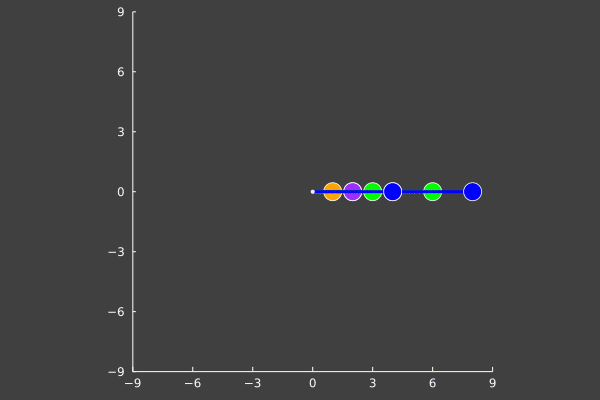

### Wyniki:
Zmiana długości nici wpływa na trajektorię podwójnego wahadła. Wpływ nie polega jedynie na przeskalowaniu obrazu, ale też na zachowanie całego układu.
#### Zmiana mas punktów materialnych

In [ ]:
lista1a = []
lista1b = []
lista2a = []
lista2b = []
lista3a = []
lista3b = []
lista4a = []
lista4b = []

wyniki1 = pendulum(0, 100, 0.05, 1, 1, 4, 4, 9.81, [0, 0, π/2, π/2])
wyniki2 = pendulum(0, 100, 0.05, 2, 2, 4, 4, 9.81, [0, 0, π/2, π/2])
wyniki3 = pendulum(0, 100, 0.05, 3, 3, 4, 4, 9.81, [0, 0, π/2, π/2])
wyniki4 = pendulum(0, 100, 0.05, 4, 4, 4, 4, 9.81, [0, 0, π/2, π/2])

dat1 = DataFrame(t = wyniki1[:,1],
                    alfa = wyniki1[:,4],
                    beta = wyniki1[:,5],
                    alfadt = wyniki1[:,2],
                    betadt = wyniki1[:,3])

dat2 = DataFrame(t = wyniki2[:,1],
                    alfa = wyniki2[:,4],
                    beta = wyniki2[:,5],
                    alfadt = wyniki2[:,2],
                    betadt = wyniki2[:,3])

dat3 = DataFrame(t = wyniki3[:,1],
                    alfa = wyniki3[:,4],
                    beta = wyniki3[:,5],
                    alfadt = wyniki3[:,2],
                    betadt = wyniki3[:,3])

dat4 = DataFrame(t = wyniki4[:,1],
                    alfa = wyniki4[:,4],
                    beta = wyniki4[:,5],
                    alfadt = wyniki4[:,2],
                    betadt = wyniki4[:,3])


for j in 1:length(dat1.alfa)
    append!(lista1a, 4*sin(dat1.alfa[j]) + 4*sin(dat1.beta[j]))
    append!(lista1b, -4*cos(dat1.alfa[j]) - 4*cos(dat1.beta[j]))
    append!(lista2a, 4*sin(dat2.alfa[j]) + 4*sin(dat2.beta[j]))
    append!(lista2b, -4*cos(dat2.alfa[j]) - 4*cos(dat2.beta[j]))
    append!(lista3a, 4*sin(dat3.alfa[j]) + 4*sin(dat3.beta[j]))
    append!(lista3b, -4*cos(dat3.alfa[j]) - 4*cos(dat3.beta[j]))
    append!(lista4a, 4*sin(dat4.alfa[j]) + 4*sin(dat4.beta[j]))
    append!(lista4b, -4*cos(dat4.alfa[j]) - 4*cos(dat4.beta[j]))
end

b = @animate for t in 1:length(dat1.alfa)

    ## m1 = m2 = 1

    plot([0,4*sin(dat1.alfa[t]), 4*sin(dat1.alfa[t]) + 4*sin(dat1.beta[t])], 
        [0,-4*cos(dat1.alfa[t]), -4*cos(dat1.alfa[t]) - 4*cos(dat1.beta[t])], 
        xlim = (-9,9),
        ylim = (-9,9),
        grid = :off,
        ratio = :equal,
        linewidth = 3,
        label = "",
        background_color = :grey25,
        legend = :none,
        title = "",
        linecolor = :orange1
    )
    scatter!(lista1a[max(1,t-15):t],lista1b[max(1,t-15):t],
        markercolor = :orange1
    )
    scatter!([4*sin(dat1.alfa[t])], 
        [-4*cos(dat1.alfa[t])],  
        markersize = 10,
        markercolor = :orange1
    )
    scatter!([4*sin(dat1.alfa[t]) + 4*sin(dat1.beta[t])], 
        [-4*cos(dat1.alfa[t]) - 4*cos(dat1.beta[t])],  
        markersize = 10,
        markercolor = :orange1
    )

    ## m1 = m2 = 2

    plot!([0,4*sin(dat2.alfa[t]), 4*sin(dat2.alfa[t]) + 4*sin(dat2.beta[t])], 
        [0,-4*cos(dat2.alfa[t]), -4*cos(dat2.alfa[t]) - 4*cos(dat2.beta[t])], 
        xlim = (-9,9),
        ylim = (-9,9),
        grid = :off,
        ratio = :equal,
        linewidth = 3,
        linecolor = :purple1
    )
    scatter!(lista2a[max(1,t-15):t],lista2b[max(1,t-15):t],
        markercolor = :purple1
    )
    scatter!([4*sin(dat2.alfa[t])], 
        [-4*cos(dat2.alfa[t])],  
        markersize = 10,
        markercolor = :purple1
    )
    scatter!([4*sin(dat2.alfa[t]) + 4*sin(dat2.beta[t])], 
        [-4*cos(dat2.alfa[t]) - 4*cos(dat2.beta[t])],  
        markersize = 10,
        markercolor = :purple1
    )

    ## m1 = m2 = 3

    plot!([0,4*sin(dat3.alfa[t]), 4*sin(dat3.alfa[t]) + 4*sin(dat3.beta[t])], 
        [0,-4*cos(dat3.alfa[t]), -4*cos(dat3.alfa[t]) - 4*cos(dat3.beta[t])], 
        xlim = (-9,9),
        ylim = (-9,9),
        grid = :off,
        ratio = :equal,
        linewidth = 3,
        linecolor = :green1
    )
    scatter!(lista3a[max(1,t-15):t],lista3b[max(1,t-15):t],
        markercolor = :green1
    )
    scatter!([4*sin(dat3.alfa[t])], 
        [-4*cos(dat3.alfa[t])],  
        markersize = 10,
        markercolor = :green1
    )
    scatter!([4*sin(dat3.alfa[t]) + 4*sin(dat3.beta[t])], 
        [-4*cos(dat3.alfa[t]) - 4*cos(dat3.beta[t])],  
        markersize = 10,
        markercolor = :green1
    )

    ## m1 = m2 = 4

    plot!([0,4*sin(dat4.alfa[t]), 4*sin(dat4.alfa[t]) + 4*sin(dat4.beta[t])], 
        [0,-4*cos(dat4.alfa[t]), -4*cos(dat4.alfa[t]) - 4*cos(dat4.beta[t])], 
        xlim = (-9,9),
        ylim = (-9,9),
        grid = :off,
        ratio = :equal,
        linewidth = 3,
        linecolor = :blue1
    )
    scatter!(lista4a[max(1,t-15):t],lista4b[max(1,t-15):t],
        markercolor = :blue1
    )
    scatter!([0],
        [0],
        markersize = 3,
        markercolor = :white
        )
    scatter!([4*sin(dat3.alfa[t])], 
        [-4*cos(dat3.alfa[t])],  
        markersize = 10,
        markercolor = :blue1
    )
    scatter!([4*sin(dat4.alfa[t]) + 4*sin(dat4.beta[t])], 
        [-4*cos(dat4.alfa[t]) - 4*cos(dat4.beta[t])],  
        markersize = 10,
        markercolor = :blue1
    )

end

display(plot(lista1a,lista1b,
    xlim = (-9,9),
    ylim = (-9,9),
    grid = :off,
    ratio = :equal,
    linecolor=:orange1,
    title = "m1 = m2 = 1"))

display(plot(lista2a,lista2b,
    xlim = (-9,9),
    ylim = (-9,9),
    grid = :off,
    ratio = :equal,
    linecolor=:purple1,
    title = "m1 = m2 = 2"))

display(plot(lista3a,lista3b,
    xlim = (-9,9),
    ylim = (-9,9),
    grid = :off,
    ratio = :equal,
    linecolor=:green1,
    title = "m1 = m2 = 3"))

display(plot(lista4a,lista4b,
    xlim = (-9,9),
    ylim = (-9,9),
    grid = :off,
    ratio = :equal,
    linecolor=:blue1,
    title = "m1 = m2 = 4"))

gif(b, "wahadlo_b.gif", fps = 30)

#### Wyniki:
Zmiana obu mas polegająca na jednoczesnym przeskalowaniu o ten sam czynnik zdaje się nie mieć wpływu na trajektorię wahadła.

## Podsumowanie projektu
1. Udało nam się wyznaczyć trajektorię podwójnego wahadła. W tym celu sprowadziliśmy równania ruchu podwójnego wahadła do układu 4 nieliniowych równań różniczkowych pierwszego stopnia, które rozwiązaliśmy za pomocą zaimplementowanego przez nas algorytmu RK4.
2. Stworzyliśmy animację obrazującą ruch podwójnego wahadła.
3. Powiązaliśmy stosunkek małej zmiany warunków początkowych (kątów jakie nici tworzą z pionem lub szybkości kątowych) do różnicy stanów podwójnego wahadła po pewnym czasie t z odpowiednimi warunkami początkowymi, a za ich sprawą z energią. Doszliśmy do wniosku, że im wyższa energia, tym większy jest wspomniany wyżej stosunek.
4. Na podstawie wybranych trajektorii doszliśmy do wniosku, że identyczna zmiana długości nici wpływa na zachowanie, a co za tym idzie na trajektorię podwójnego wahadła, czego nie można powiedzieć o identycznej zmiane mas punktów materialnych. Wynika to z tego, że energia całkowita jest wprost proporcjonalna do kwadratu masy, ale w przypadku długości zależność uwzględnia kwadrat i czynnik liniowy.

W celu weryfikacji niektórych z uzyskanych wyników korzystaliśmy z pracy: Tomasz Stachowiak, Toshio Okada. A numerical analysis of chaos in the double pendulum. Chaos,
Solitons and Fractals, Elsevier, 2006, 29 (2), pp.417 - 422. ff10.1016/j.chaos.2005.08.032ff. ffhal01389907

Dostępnej pod adresem: https://hal.archives-ouvertes.fr/hal-01389907/document